In [1]:
import os
import sys
sys.path.append(os.path.join(os.path.dirname(os.getcwd()), 'src'))

from pathlib import Path
import cv2
import numpy as np
import matplotlib.pyplot as plt
from datetime import date
plt.rcParams["figure.figsize"] = (24,18)

from cv_utils import *
from pitch_segmentation import *

import albumentations
from torchvision import *

import segmentation_models_pytorch as smp

In [2]:
train = False
generate = False
merge = False
convert = False
res_unet_train = True

In [3]:
data_path = os.path.join(os.path.dirname(os.getcwd()), 'data')
coco_dataset_path_1 = os.path.join(data_path, 'coco_datasets/real_train_pitch_object')
coco_dataset_path_2 = os.path.join(data_path, 'coco_datasets/synth_train_pitch_object')
folder_name_1 = 'real_train_pitch_object'
folder_name_2 = 'synth_train_pitch_object'
if convert:
    cvat2coco(folder_name_1, data_path)
    cvat2coco(folder_name_2 , data_path)
if merge:
    dest_path=os.path.join(data_path, 'coco_datasets')
    pitch_object_dataset_path = merge_coco_dataset(coco_dataset_path_1, coco_dataset_path_2,
                    dest_path=os.path.join(data_path, 'coco_datasets'))
else:
    pitch_object_dataset_path = os.path.join(data_path, 'coco_datasets/real_synth_train_pitch_object')

pitch_segment_dataset_path = os.path.join(data_path, 'coco_datasets/real_synth_train_pitch')

if generate:
    complete_dataset_path = generate_complete_pitch_segment_dataset(data_path, pitch_object_dataset_path, pitch_segment_dataset_path)
else:
    complete_dataset_path = os.path.join(data_path, 'coco_datasets/completed_pitch_segments_all_match')

### Load data

<Figure size 2400x1800 with 0 Axes>

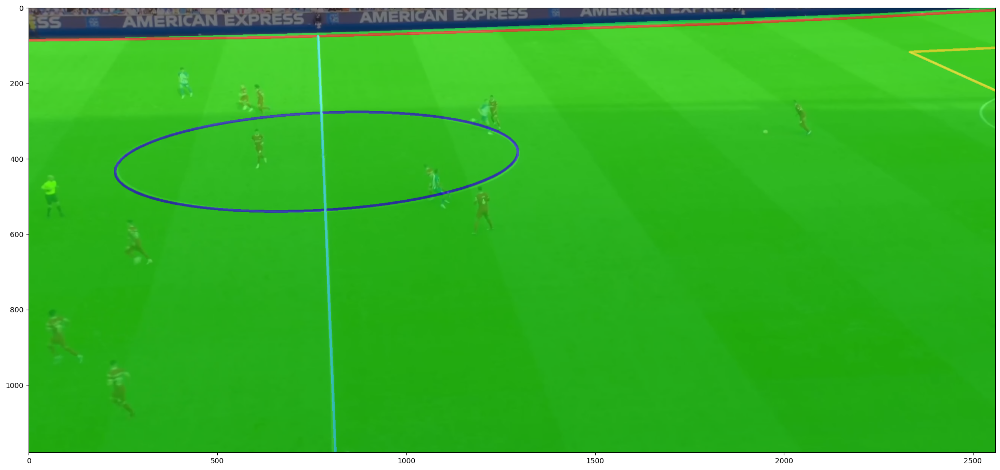

In [4]:
image_folder = os.path.join(complete_dataset_path, "images")
annotation_file = os.path.join(complete_dataset_path, "annotations", "instances_default.json")

with open(annotation_file, 'r') as f:
    annotations = json.load(f)

for image_id in range(1, 2):
    image_name = [image_info["file_name"] for image_info in annotations['images']
                                            if image_info['id'] == image_id][0]
    annotation_list = [annotation 
                        for annotation in annotations['annotations']
                        if annotation['image_id'] == image_id]

    image_path = os.path.join(image_folder, image_name)
    image = cv2.cvtColor(cv2.imread(image_path, 
                                            cv2.IMREAD_UNCHANGED), cv2.COLOR_BGR2RGB)
    plt.figure()


    mask = np.zeros(image.shape, dtype=np.uint8)
    #print(annotation_list)
    for annotation in annotation_list:
        if annotation['category_id'] == 1:
            contours = np.array(annotation['segmentation']).reshape(1, -1, 2).astype(np.int32)
            x, y, w, h = cv2.boundingRect(contours)
            cv2.drawContours(mask, contours, -1, (0, 255, 0), -1)
        elif annotation['category_id'] == 4:
            cv2.ellipse(mask, annotation['center'], annotation['length'],
                        annotation['angle'], 0, 360, (0, 0, 255), 5)
        elif annotation['category_id'] == 5:
            contours = np.array(annotation['segmentation']).reshape(1, -1, 2).astype(np.int32)
            cv2.drawContours(mask, contours, -1, (255, 255, 255), -1)
        else:
            line = np.array(annotation['segmentation']).reshape(1, -1, 2).astype(np.int32)[0]

            if annotation['category_id'] == 2:
                color = (255, 0, 0)
            elif annotation['category_id'] == 3:
                color = (255, 255, 0)
            elif annotation['category_id'] == 6:
                color = (0, 255, 255)
            #if len(line) == 2:
                #cv2.line(mask, line[0], line[1], color, 5)
            #else:
            cv2.polylines(mask, [line], False, color, 5)

    cropped_image = image[y:y + h, x:x + w]
    cropped_mask = mask[y:y + h, x:x + w]
    plt.figure()
    plt.imshow(cropped_image)
    plt.imshow(cropped_mask, alpha=0.5)

# mask = np.zeros(image.shape[:2], dtype=np.uint8)
# cv2.fillPoly(mask, [annotation], color=255)
# plt.figure()
# plt.imshow(mask, cmap='gray', vmin=0, vmax=255)

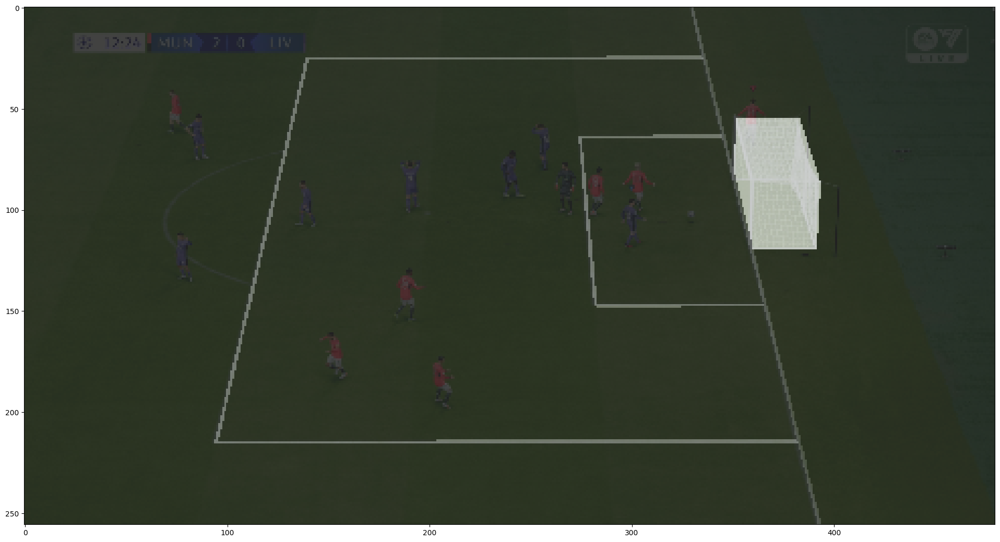

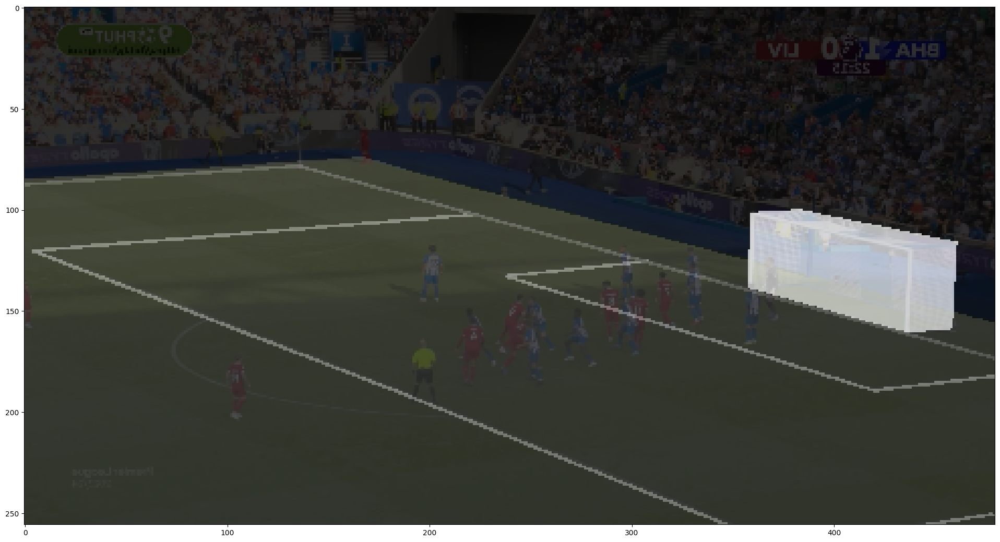

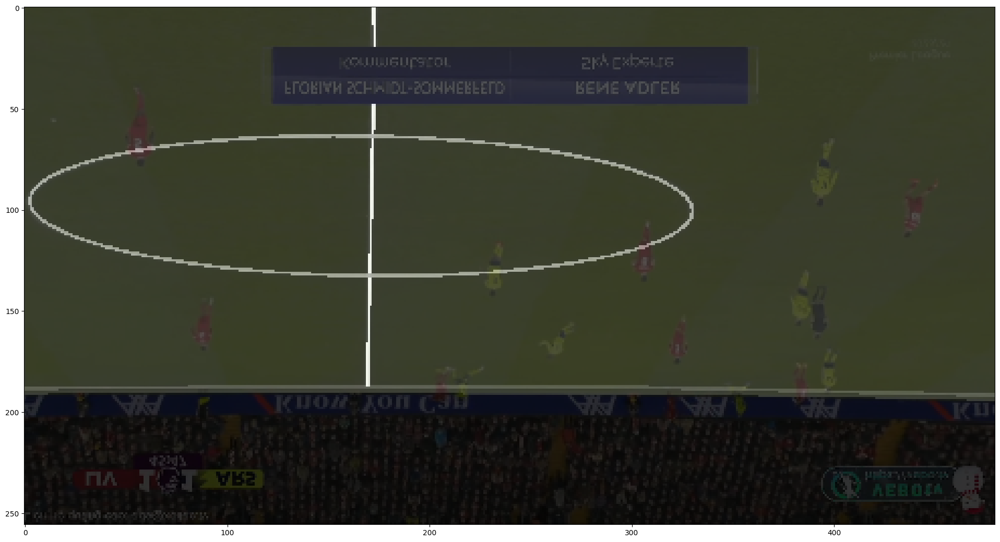

In [5]:
image_folder = os.path.join(complete_dataset_path, "images")
annotation_file = os.path.join(complete_dataset_path, "annotations", "instances_default.json")

transform = albumentations.Compose([
        albumentations.Resize(256*2, 480*2),
        albumentations.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5),
        albumentations.HorizontalFlip(p=0.5),
        albumentations.VerticalFlip(p=0.5)
        ])

batch_size = 6
dataset = PitchObjectDataset(image_folder=image_folder, annotation_file=annotation_file
                       , transform=transform)
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
images, masks, one_hot_mask = next(iter(data_loader))

for i in range(int(batch_size/2)):
    plt.figure()
    plt.imshow(images[i].permute(1, 2, 0).numpy())
    plt.imshow((masks[i].permute(1, 2, 0).numpy()*255).astype(np.int32), cmap='gray',
               vmin=0, vmax=255, alpha=0.8)


### Train model

In [6]:
if train:
    temp = None
    torch.cuda.empty_cache()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = PitchObjectSegmentation().to(device)
    print(device)

    criterion = iou_multiclass_loss
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.05, weight_decay=1e-4)
    average_loss_list = []
    scheduler = lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

    epochs = 50
    model.train()
    for epoch in range(epochs):
        model.train()
        total_loss = 0.0

        for inputs, targets in tqdm(data_loader):
            inputs, targets = inputs.to(device), targets.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            outputs_softmax = F.softmax(outputs, dim=1)
            outputs_argmax = torch.argmax(outputs_softmax, dim=1)
            print(outputs_argmax.size(), targets.size())
            loss = criterion(outputs, (targets.squeeze(1) * 255 / 42).long())
            if loss.item() < 0:
                print(loss.item())
                temp = inputs.cpu(), outputs.cpu(), targets.cpu()
                break
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        average_loss = total_loss / len(data_loader)
        average_loss_list.append(average_loss)
        print(f'Epoch [{epoch + 1}/{epochs}], Loss: {average_loss}')

    plt.figure()
    plt.plot(range(1, epochs+1), average_loss_list, label='loss')
    plt.yscale("log")
    plt.title("Training Loss")
    plt.legend()

    model_path = os.path.join(os.path.dirname(os.getcwd()), 'models')
    model_name = 'pitch_object_detect'
    torch.save(model.state_dict(), os.path.join(model_path, model_name))


In [7]:
# model = smp.Unet("resnet34", encoder_weights="imagenet", activation=None, classes=7)
# preds = model(images)
# #plt.figure()
# #plt.imshow((masks[0]*255).squeeze().numpy(), vmin=0, vmax=255)

# targets_one_hot = torch.zeros_like(preds)
# targets_one_hot.scatter_(1, (masks*255/42).long(), 1)
# temp = targets_one_hot[0]
# for i in range(temp.size()[0]):
#     temp_nth_channel = (temp[i].squeeze()*255).numpy()
#     #print(np.unique(temp_nth_channel))
#     #plt.figure()
#     #plt.imshow(temp_nth_channel, vmin=0, vmax=255)
# for inputs, targets, _ in tqdm(data_loader):
#     preds = model(inputs)
#     targets_one_hot = torch.zeros_like(preds)
#     targets_one_hot.scatter_(1, (targets*255/42).long(), 1)
    
#     smooth = 1e5
#     dice_sum = 0.
#     for i in range(preds.size()[1]):
#         channel_pred = preds[:, i, :, :]
#         channel_target = targets_one_hot[:, i, :, :]
#         channel_iflat = torch.sigmoid(channel_pred).flatten()
#         channel_tflat =  channel_target.flatten()
#         channel_intersection = (channel_iflat * channel_tflat).sum()
#         dice_channel = 1 - ((2.0 * channel_intersection + smooth) / (channel_iflat.sum() + channel_tflat.sum() + smooth))

#         if dice_channel > 1:
#             print(dice_channel)
#             plt.figure()
#             plt.imshow(channel_target*255, vmin=0, vmax=255)
#         dice_channel = dice_channel*0.2 if i==1 else dice_channel
#         dice_sum += dice_channel
#     dice_sum = dice_sum/preds.size()[1]

cuda


100%|██████████| 200/200 [1:42:08<00:00, 30.64s/it]


Epoch [1/200], Loss: 0.007053028313944546
Epoch [11/200], Loss: 0.007140901828041443
Epoch [21/200], Loss: 0.006616960886794214
Epoch [31/200], Loss: 0.007303284504450858
Epoch [41/200], Loss: 0.0064641335280612115
Epoch [51/200], Loss: 0.006475750718695613
Epoch [61/200], Loss: 0.00657975843641907
Epoch [71/200], Loss: 0.006597212349207929
Epoch [81/200], Loss: 0.006976379291154444
Epoch [91/200], Loss: 0.006444538637207678
Epoch [101/200], Loss: 0.00645698533894924
Epoch [111/200], Loss: 0.006691579198321471
Epoch [121/200], Loss: 0.006622623782963134
Epoch [131/200], Loss: 0.006767427226385245
Epoch [141/200], Loss: 0.006585990667987901
Epoch [151/200], Loss: 0.0065167714823753786
Epoch [161/200], Loss: 0.006454448439539052
Epoch [171/200], Loss: 0.007112132453431304
Epoch [181/200], Loss: 0.006925192740387641
Epoch [191/200], Loss: 0.006871995059415125


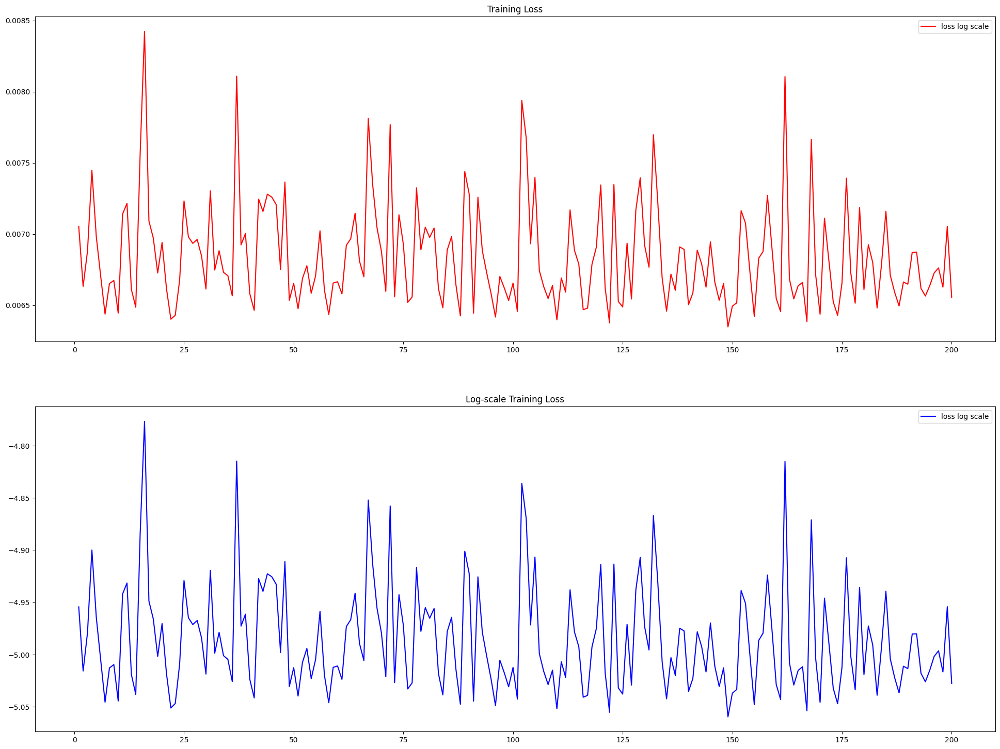

In [8]:
model = smp.Unet("resnet34", encoder_weights="imagenet", activation=None, classes=7)
model_path = os.path.join(os.path.dirname(os.getcwd()), 'models')
model_name = 'res_unet_256.pth'
model_path = os.path.join(model_path, model_name)
model.load_state_dict(torch.load(model_path))

if res_unet_train:
    temp = None
    torch.cuda.empty_cache()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    print(device)

    criterion = FocalLoss(gamma=2)
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
    average_loss_list = []
    scheduler = lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.2)

    epochs = 200
    model.train()
    for epoch in tqdm(range(epochs)):
        model.train()
        total_loss = 0.0

        for inputs, targets, _ in data_loader: #tqdm(data_loader):
            inputs, targets  = inputs.to(device), targets.to(device)

            optimizer.zero_grad()
            preds = model(inputs)
            
            targets_one_hot = torch.zeros_like(preds)
            targets_one_hot.scatter_(1, (targets*255/42).long(), 1)
            
            loss = criterion(preds, targets_one_hot)
            if loss.item() < 0:
                print(loss.item())
                temp = inputs.cpu(), preds.cpu(), targets.cpu()
                break
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        average_loss = total_loss / len(data_loader)
        average_loss_list.append(average_loss)
        # print(f'Epoch [{epoch + 1}/{epochs}], Loss: {average_loss}')

    plt.subplot(2, 1, 1)
    plt.plot(range(1, epochs+1), average_loss_list, color='red',
              label='loss log scale')
    plt.title("Training Loss")
    plt.legend()

    plt.subplot(2, 1, 2)
    plt.plot(range(1, epochs+1), np.log(average_loss_list), color='blue',
              label='loss log scale')
    plt.title("Log-scale Training Loss")
    plt.legend()

    model_path = os.path.join(os.path.dirname(os.getcwd()), 'models')
    model_name = 'res_unet_512.pth'
    torch.save(model.state_dict(), os.path.join(model_path, model_name))

    for epoch in range(0, epochs, int(epochs*5/100)):
        print(f'Epoch [{epoch + 1}/{epochs}], Loss: {average_loss_list[epoch]}')

### Inference

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


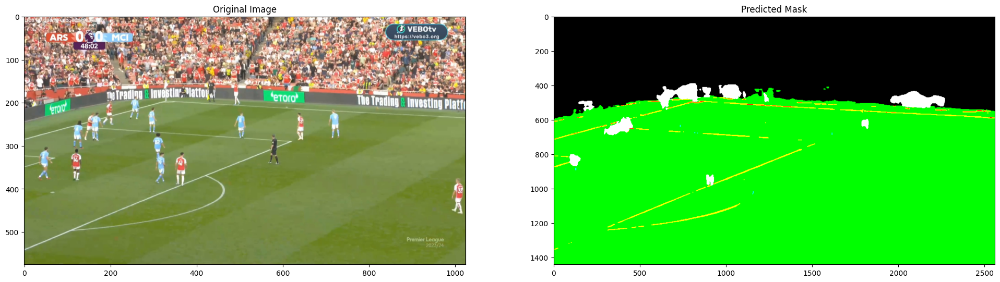

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


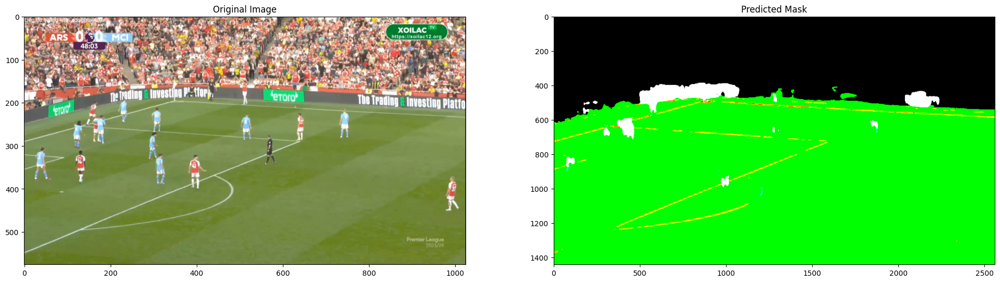

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


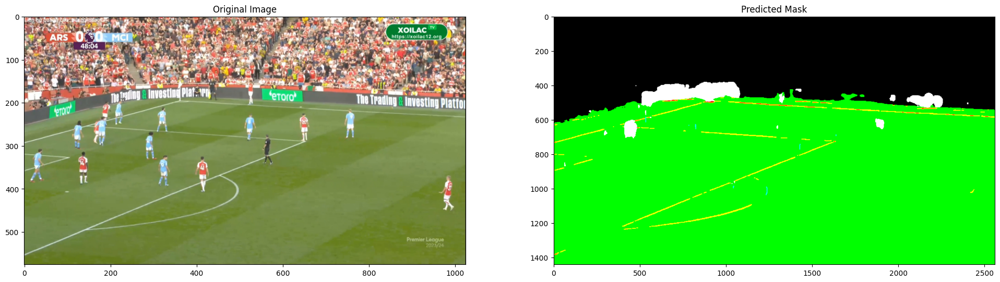

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


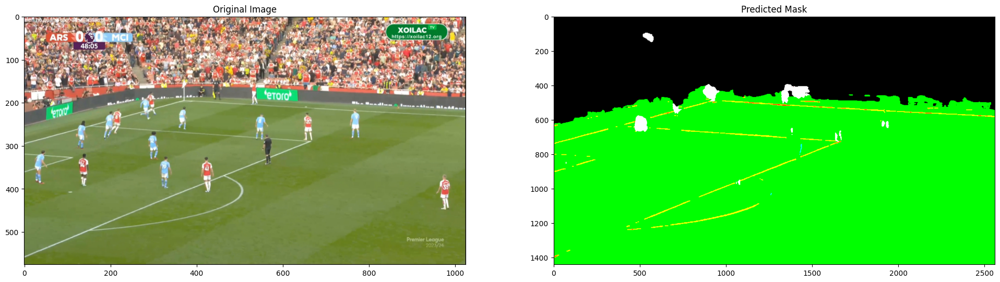

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


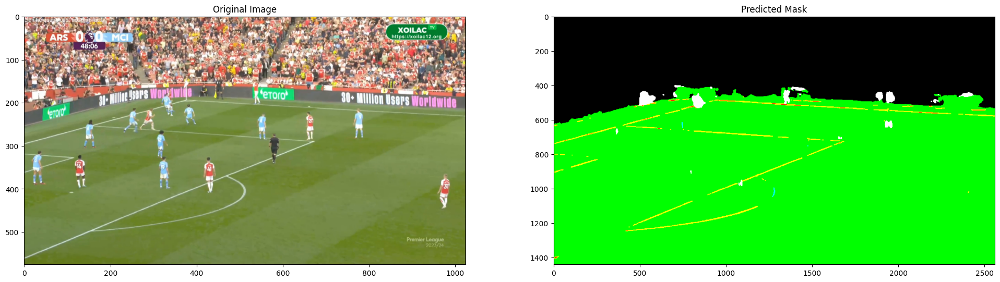

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


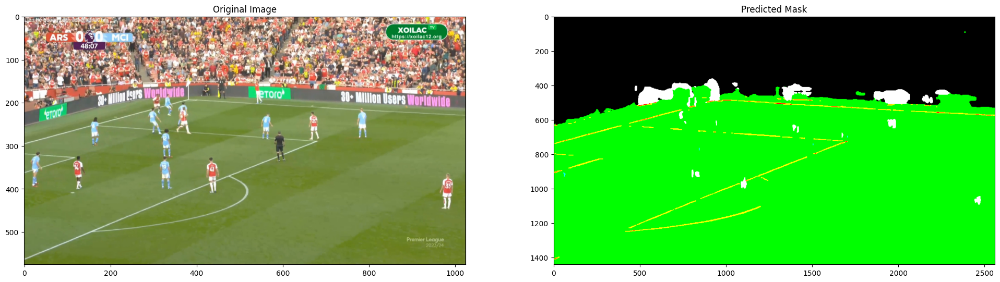

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


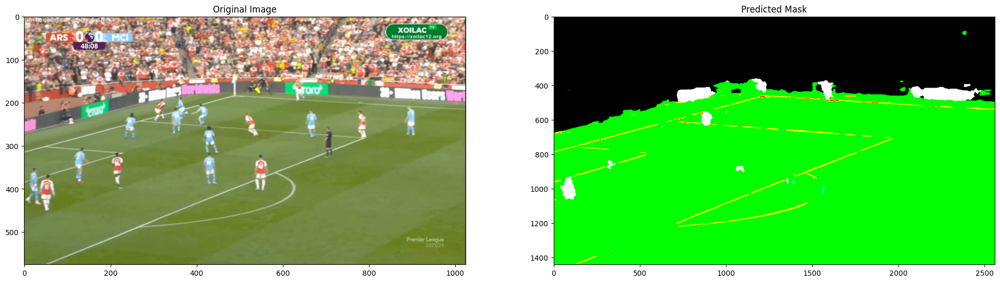

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


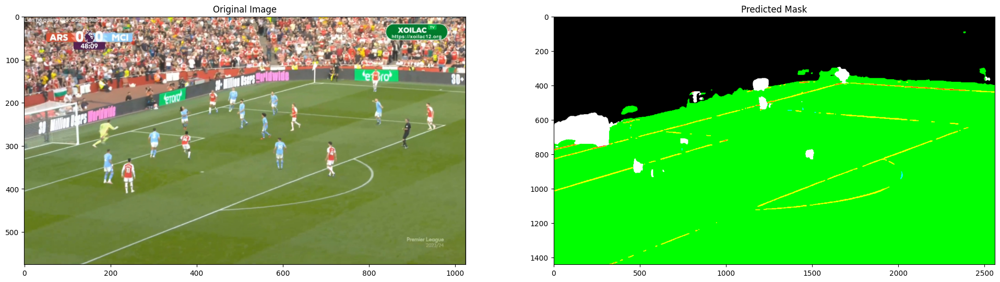

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


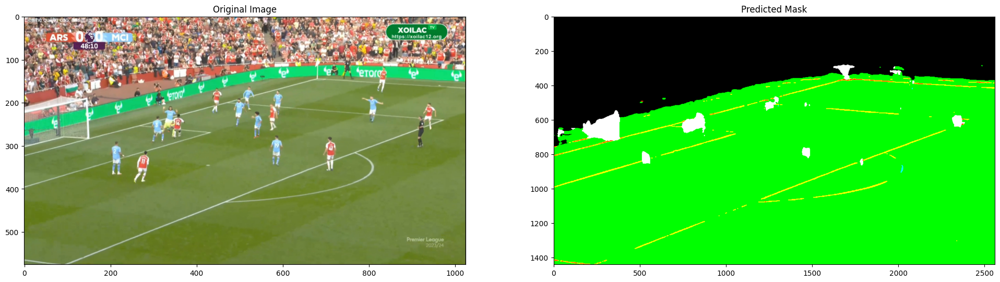

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


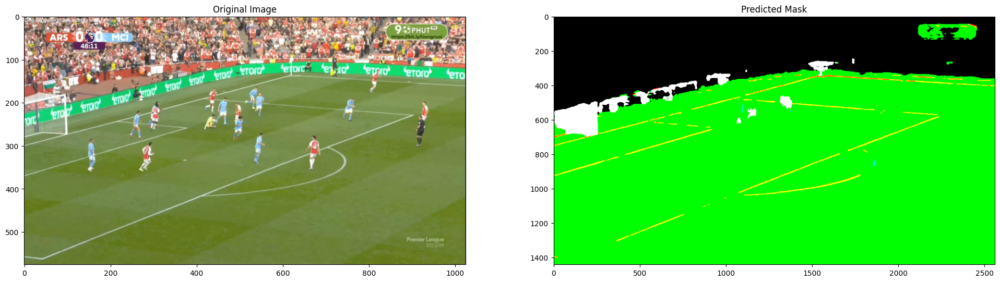

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


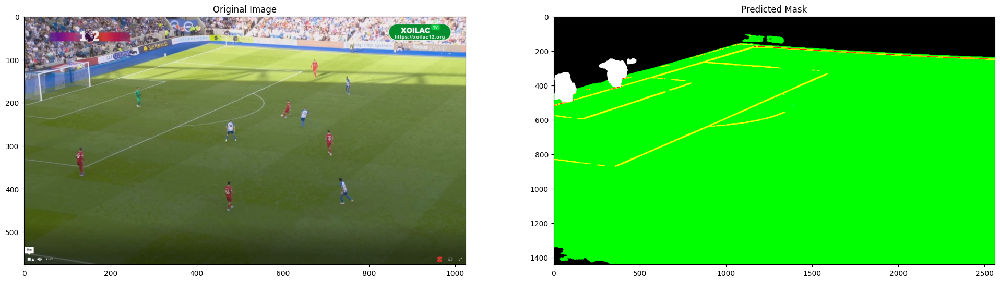

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


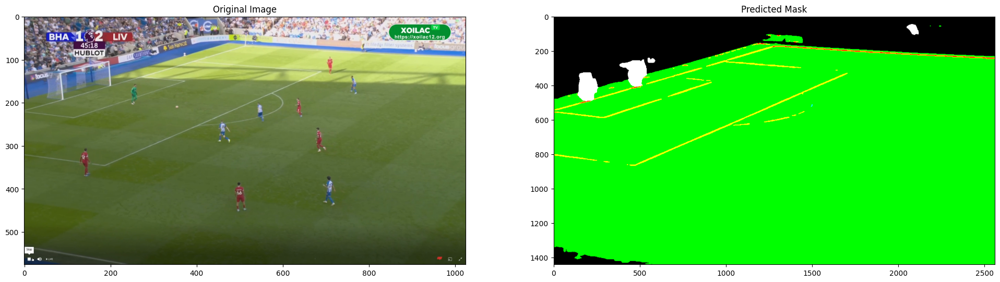

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


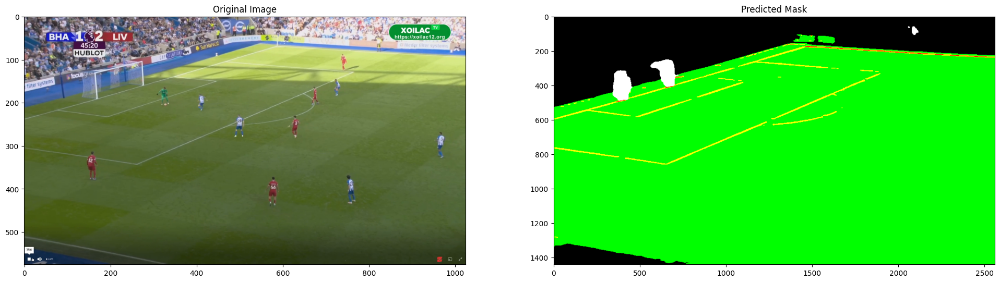

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


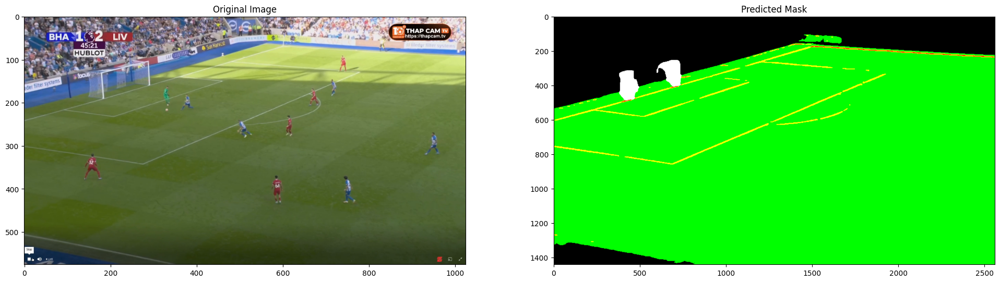

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


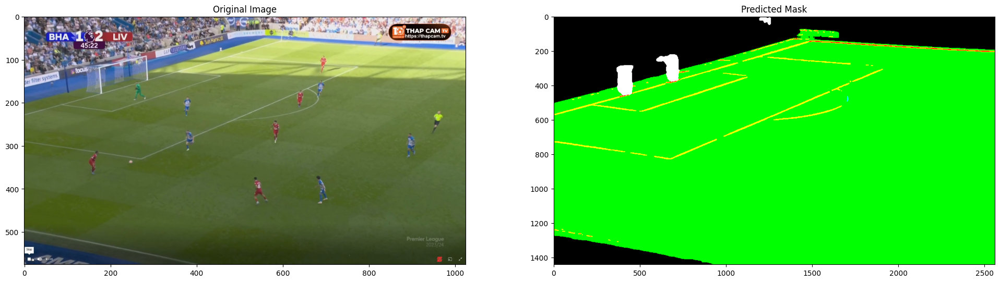

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


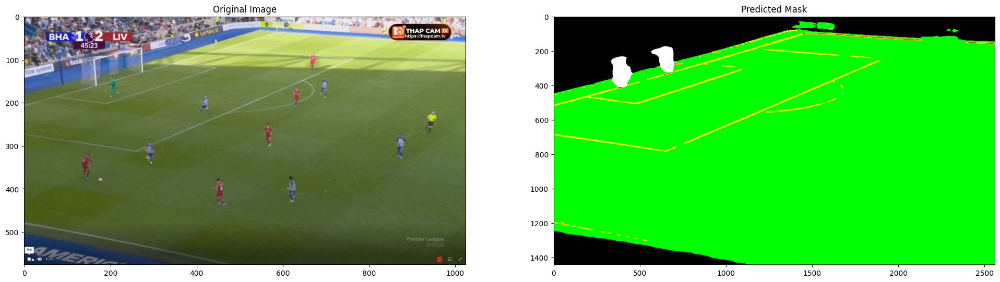

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


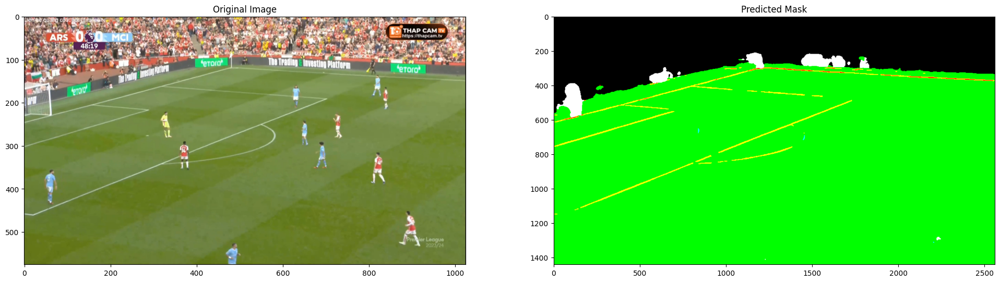

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


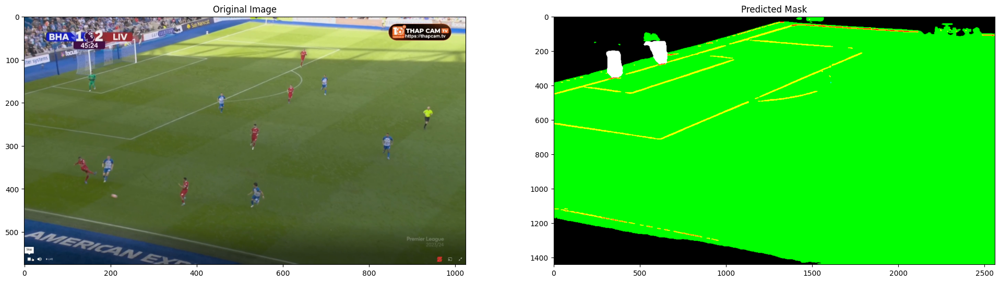

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


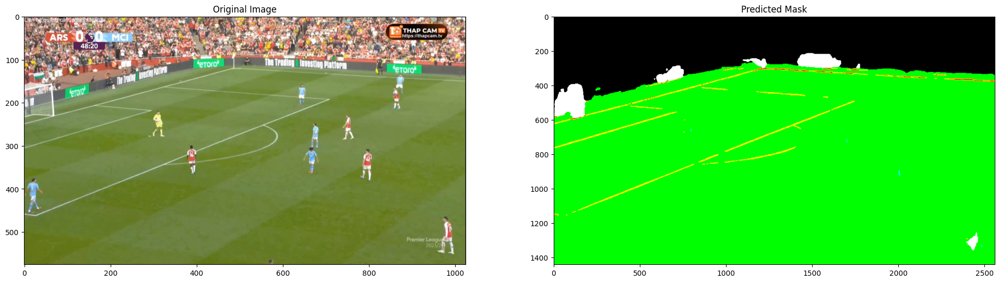

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


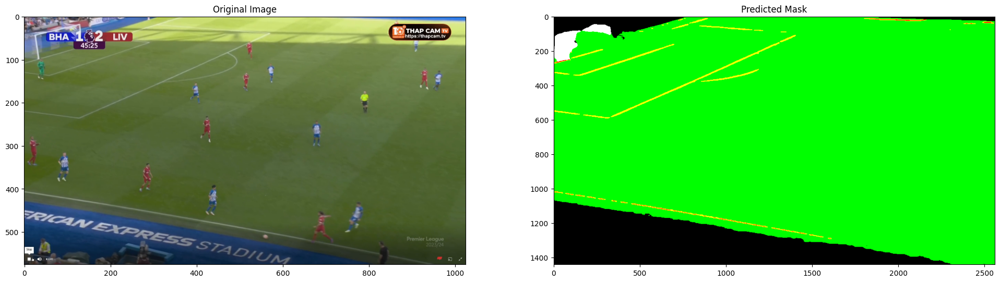

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


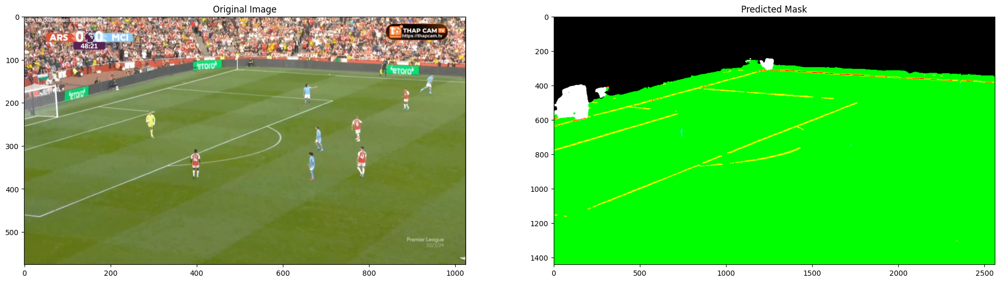

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


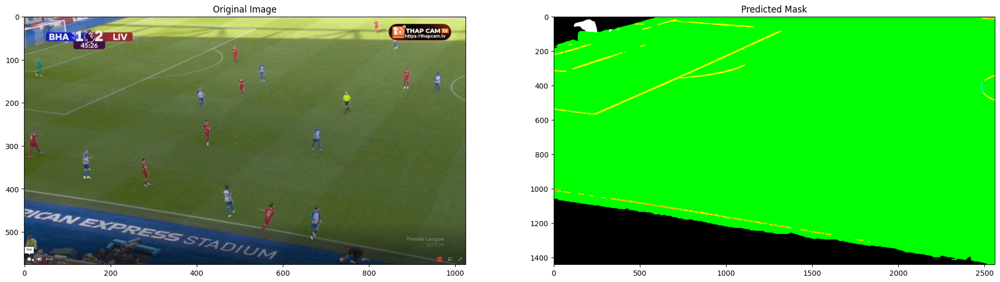

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


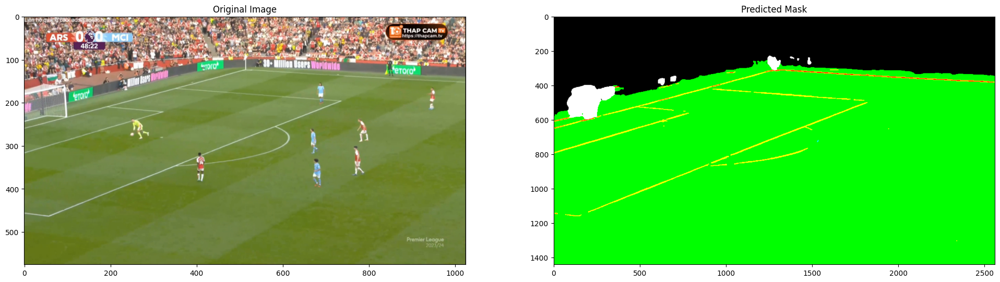

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


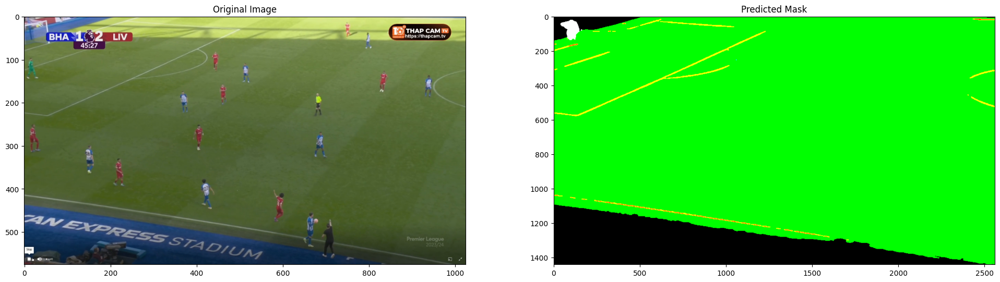

[0 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


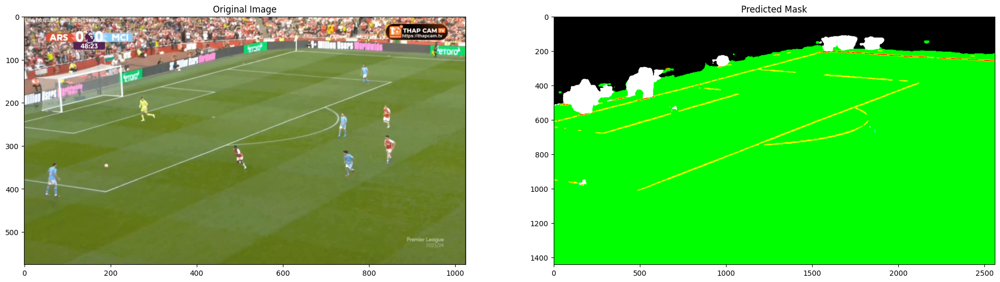

[0 6]


KeyboardInterrupt: 

In [10]:
torch.cuda.empty_cache()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = os.path.join(os.path.dirname(os.getcwd()), 'models')
model_name = 'res_unet_512.pth'
model_path = os.path.join(model_path, model_name)
model = smp.Unet("resnet34", encoder_weights="imagenet", activation=None, classes=7)
model.load_state_dict(torch.load(model_path))

vid_name = 'real_test'
images_path = os.path.join(data_path, 'images' + '/' + vid_name)

device = "cuda" if torch.cuda.is_available() else "cpu"

for image_name in sorted(os.listdir(images_path)):
    image_path = os.path.join(images_path, image_name)#sorted(os.listdir(images_path))[8])
    rgb_image = cv2.imread(image_path, cv2.COLOR_BGR2RGB)  
    binary_mask, colored_mask = pitch_segment(rgb_image, model, visualize=True, device=device)
    print(np.unique((mask/42).astype(np.uint8)))
    if not os.path.exists(os.path.join(data_path, 'images/segment_object_by_dl_incremental')):
        os.mkdir(os.path.join(data_path, 'images/segment_object_by_dl_incremental'))                       
    cv2.imwrite(os.path.join(data_path, 'images/segment_object_by_dl_incremental/'+image_name[:-4] + '_colored_mask.png'), colored_mask[:,:,::-1])                       
    cv2.imwrite(os.path.join(data_path, 'images/segment_object_by_dl_incremental/'+image_name[:-4] + '_gray_mask.png'), binary_mask)
